In [1]:
!wget -q https://github.com/DM-GY-9103-2024F-H/9103-utils/raw/main/src/data_utils.py
!wget -q https://github.com/DM-GY-9103-2024F-H/9103-utils/raw/main/src/image_utils.py

!wget -qO- https://github.com/DM-GY-9103-2024F-H/9103-utils/releases/latest/download/lfw.tar.gz | tar xz

In [18]:
import pandas as pd
import torch

import os
from os import listdir, path
from sklearn.model_selection import train_test_split
from torch import nn, Tensor
from torch.nn.functional import relu
from torch.utils.data import DataLoader

from image_utils import make_image, open_image
from HW12_utils import HW12Utils, FaceDataset

from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from PIL import Image
import matplotlib.pyplot as plt

## 1. For a simple NN, visualize the first layer across epochs as the loss decreses

In [24]:
# Define custom class to specify output from first layer
class CustomModel(nn.Module):
    def __init__(self, input_size, output_size):
        super(CustomModel, self).__init__()
        # Define layers
        self.layer1 = nn.Linear(input_size, 221)  # Input to hidden layer
        self.relu = nn.ReLU()  # ReLU activation
        self.layer2 = nn.Linear(221, output_size)  # Hidden to output layer

    def forward(self, x):
        x1 = self.layer1(x)  # After first layer
        x2 = self.relu(x1)  # After ReLU activation
        output = self.layer2(x2)  # Final output
        return x1, x2, output 

In [21]:
# Visualize the first layer
def visualize_layer(img_path, model, e, output_folder):
    img = Image.open(img_path)
    img = img_to_array(img)  

    # Normalize and flatten the image
    img = img / 255.0  
    img = img.flatten()  
    img = torch.tensor(img).unsqueeze(0).float()  

    # Pass the image through the model to get both the feature map and final output
    x1, x2, _ = model(img)  

    # Reshape the feature map to visualize it (e.g., 8x16 grid for 128 features)
    x1 = x1.detach().numpy().reshape(17, 13)  
    x2 = x2.detach().numpy().reshape(17, 13)  

    # Visualize the feature map
    plt.figure(figsize=(8, 8))
    plt.imshow(x2, aspect='auto')
    plt.title("Epoch: " + str(e))

    output_path = os.path.join(output_folder, f"epoch_{e}.png")
    plt.savefig(output_path, dpi=300)
    plt.show()

In [25]:
# Prep the face dataset 
train, test = LFWUtils.train_test_split(0.5)

x_train = Tensor(train["pixels"])
y_train = Tensor(train["labels"]).long()

x_test = Tensor(test["pixels"])
y_test = Tensor(test["labels"]).long()

train_dataloader = DataLoader(FaceDataset(x_train, y_train), batch_size=128, shuffle=True)
test_dataloader = DataLoader(FaceDataset(x_test, y_test), batch_size=512)

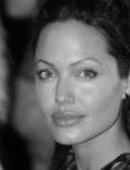

In [26]:
# Look at one input image
img_path = 'data/image/lfw/cropped/jolie/jolie-019.jpg'
Image.open(img_path).show()

Epoch: 0 loss: 46.5743


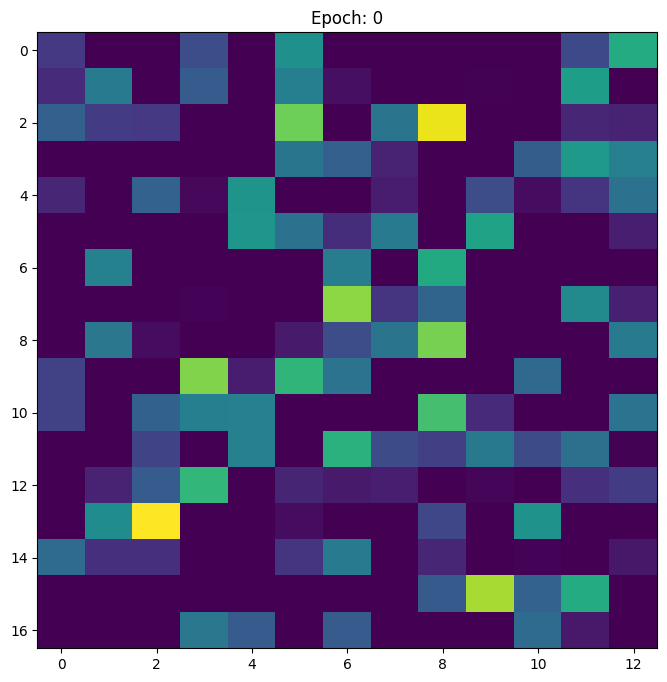

Epoch: 50 loss: 6.6924


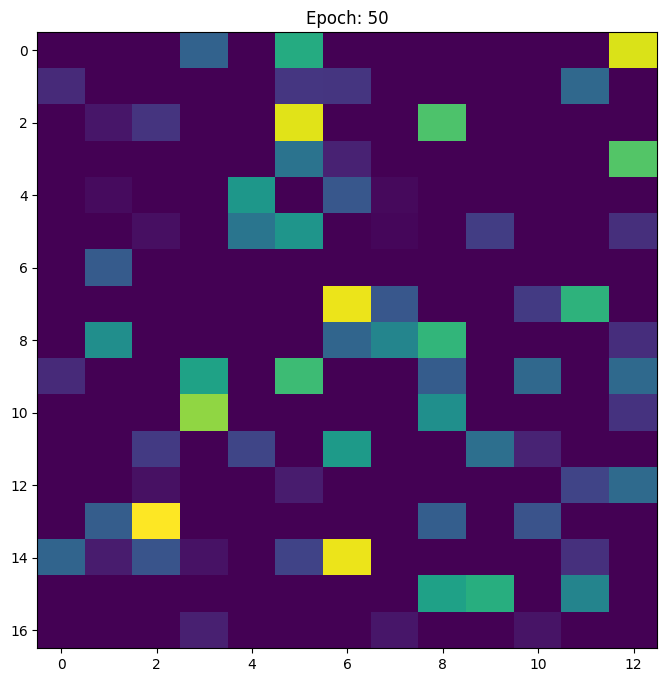

Epoch: 100 loss: 3.2996


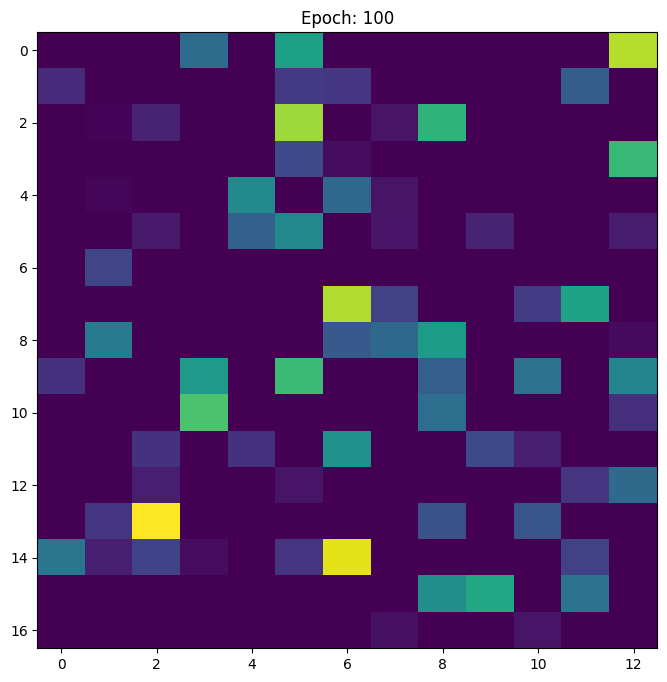

Epoch: 150 loss: 2.3338


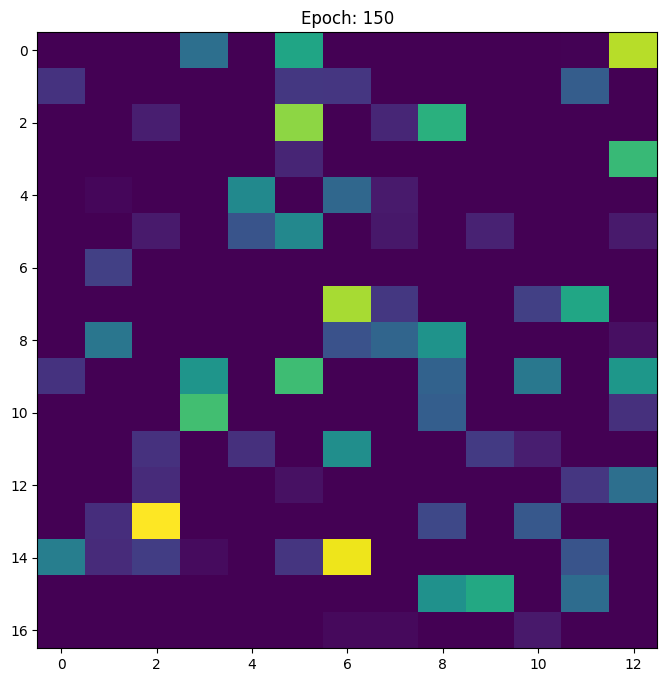

Epoch: 200 loss: 0.9798


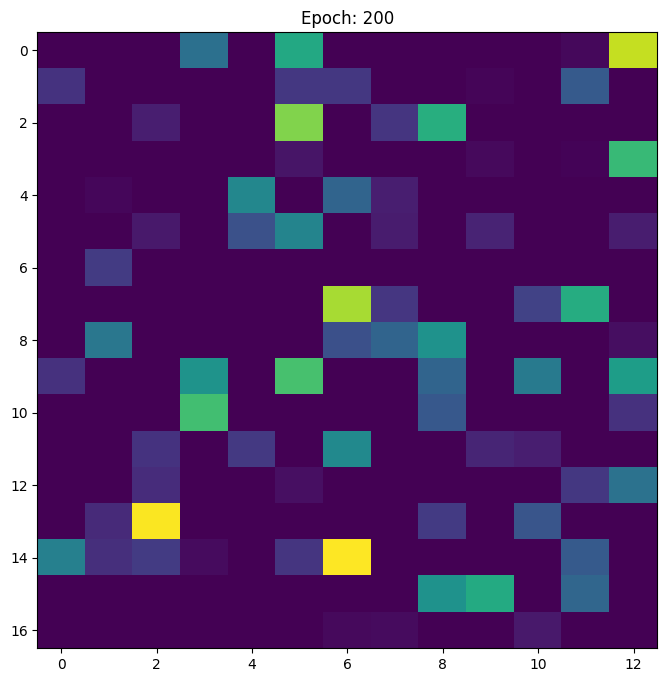

Epoch: 250 loss: 0.7665


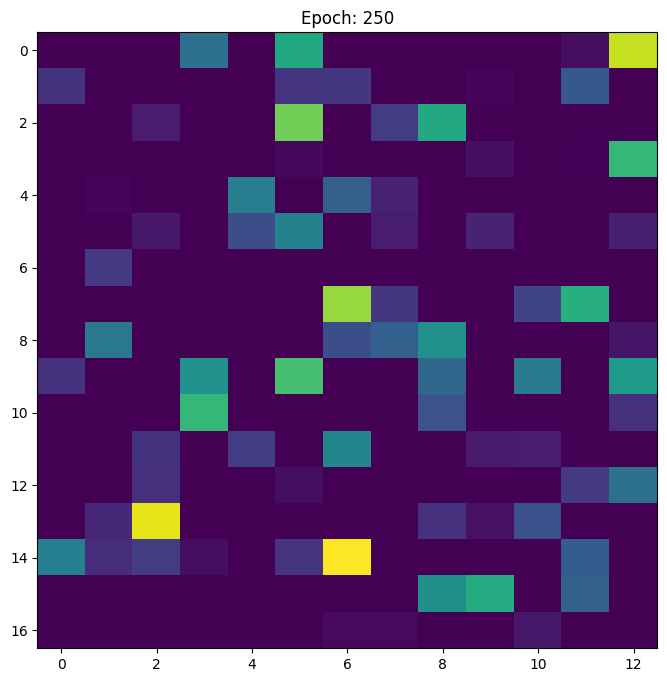

Epoch: 300 loss: 0.4306


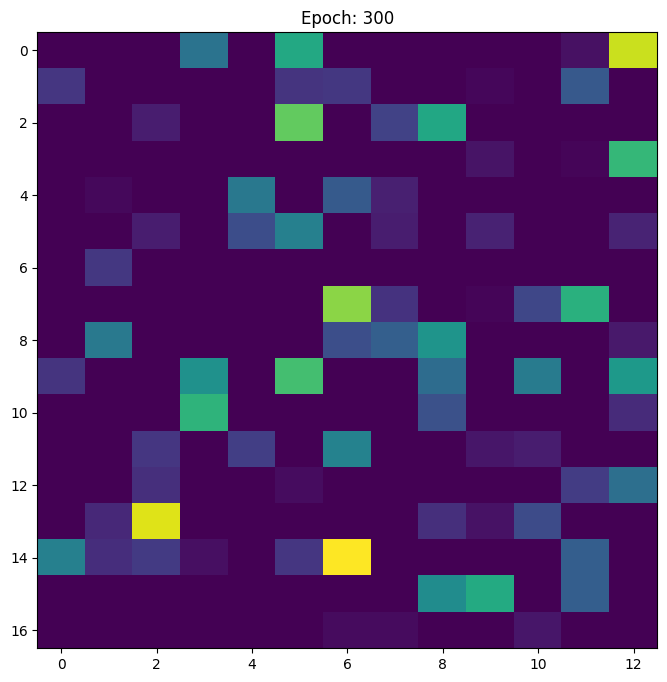

Epoch: 350 loss: 0.1737


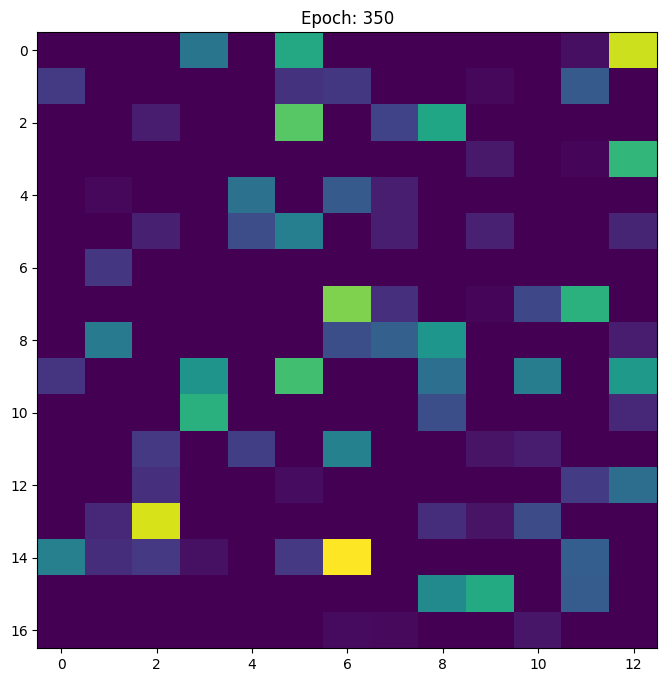

Epoch: 400 loss: 0.2589


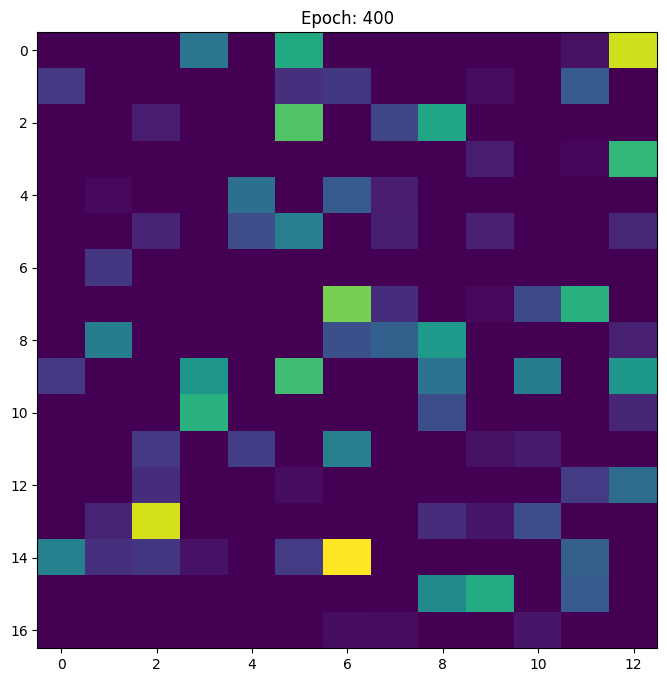

Epoch: 450 loss: 0.1187


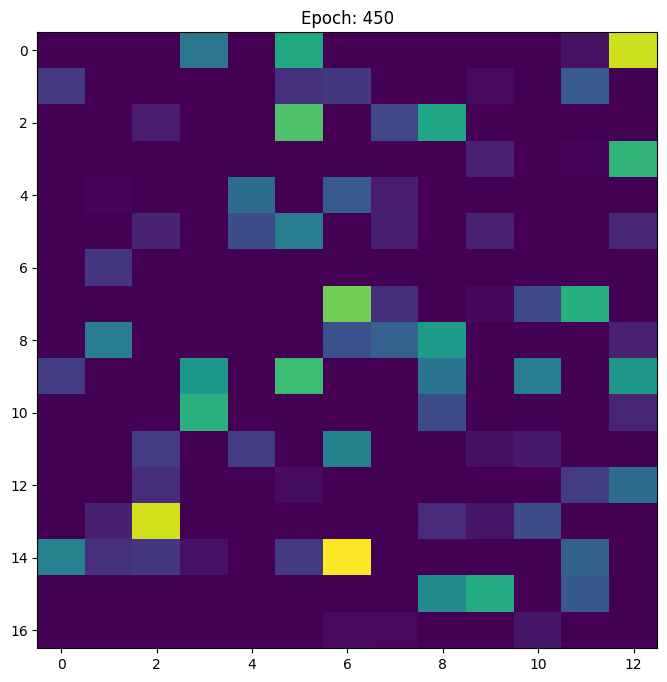

In [27]:
# Define the model
img_path = 'data/image/lfw/cropped/jolie/jolie-019.jpg'
input_size = 22100
output_size = len(y_train.unique())
model = CustomModel(input_size, output_size)

img, label = next(iter(train_dataloader))
out = model(img)

# Train the model
learning_rate = 1e-7
optim = torch.optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)
loss_fn = nn.CrossEntropyLoss()

for e in range(500):
  
  for imgs, labels in train_dataloader:
    optim.zero_grad()
    _, _, output = model(imgs)

    loss = loss_fn(output, labels)

    loss.backward()
    optim.step()

  # Visualize layer for each 50th epoch
  if e % 50 == 0:
    print(f"Epoch: {e} loss: {loss.item():.4f}")
    visualize_layer(img_path, model, e, "output_imgs/model1")

## 2. Use a pre-trained model and visualize the different layers

In [1]:
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.models import Model
from matplotlib import pyplot as plt
import numpy as np
from numpy import expand_dims

2024-12-14 04:34:39.366333: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1734150879.662029   28663 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1734150879.761826   28663 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-14 04:34:40.415650: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


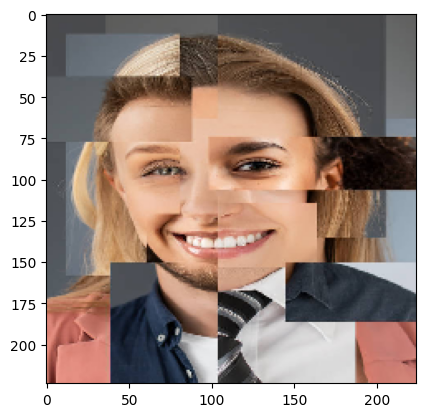

In [5]:
img = load_img('input_imgs/mosaic_face.jpg',target_size=(224, 224))
# img = load_img('/content/drive/MyDrive/Git Repos/Project/cnn_layers/imgs/bird.jpg')
plt.imshow(img)

### 2a. Try VGG16 model

In [ ]:
def visualize_vgg_layers(img, output_folder):
    model = VGG16()
    # redefine model to output right after the first hidden layer
    ixs = [2, 5, 9, 13, 17]
    outputs = [model.layers[i].output for i in ixs]
    model = Model(inputs=model.inputs, outputs=outputs)
    # expand dimensions so that it represents a single 'sample'
    img = expand_dims(img, axis=0)
    # prepare the image (e.g. scale pixel values for the vgg)
    img = preprocess_input(img)
    # get feature map for first hidden layer
    feature_maps = model.predict(img)
    # plot the output from each block
    square = 8
    for fmap in feature_maps:
        # plot all 64 maps in an 8x8 squares
        ix = 1
        for _ in range(square):
            for _ in range(square):
                # specify subplot and turn of axis
                ax = plt.subplot(square, square, ix)
                ax.set_xticks([])
                ax.set_yticks([])
                # plot filter channel
                plt.imshow(fmap[0, :, :, ix-1])
                ix += 1
        
        # show the figure
        output_path = os.path.join(output_folder, f"figure_{uuid.uuid4().hex}.png")
        plt.savefig(output_path, dpi=300)
        plt.show()

/home/codespace/.python/current/lib/python3.12/site-packages/keras/src/models/functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_138']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


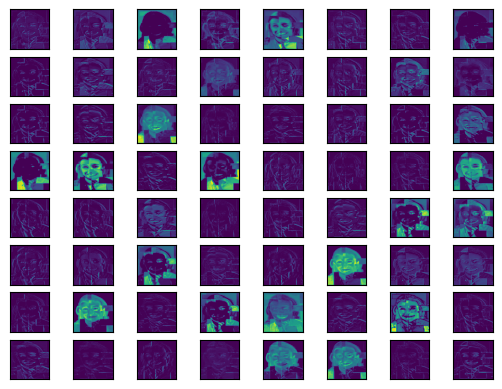

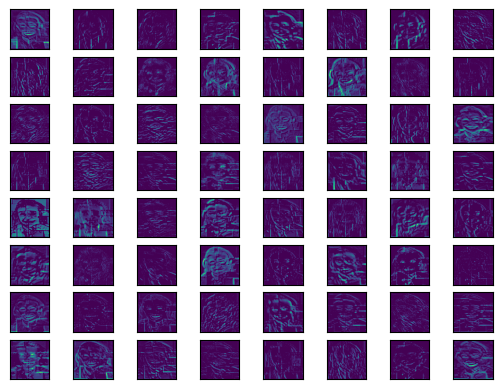

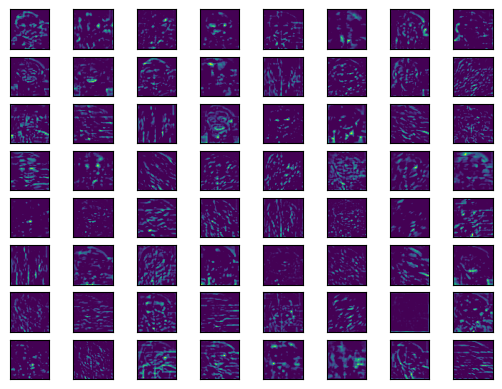

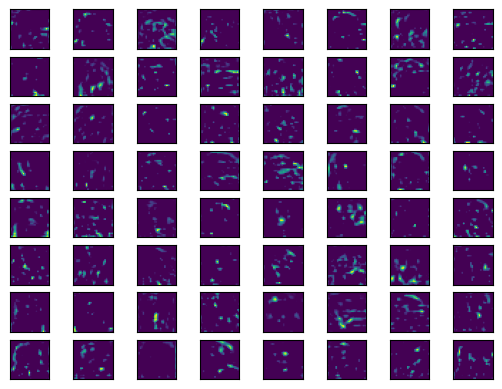

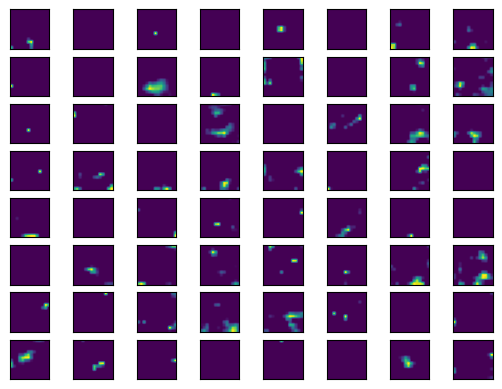

In [ ]:
import os
import uuid

visualize_vgg_layers(img, "output_imgs/vgg")

### 2b. Try Resnet model

/home/codespace/.python/current/lib/python3.12/site-packages/keras/src/models/functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_511']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


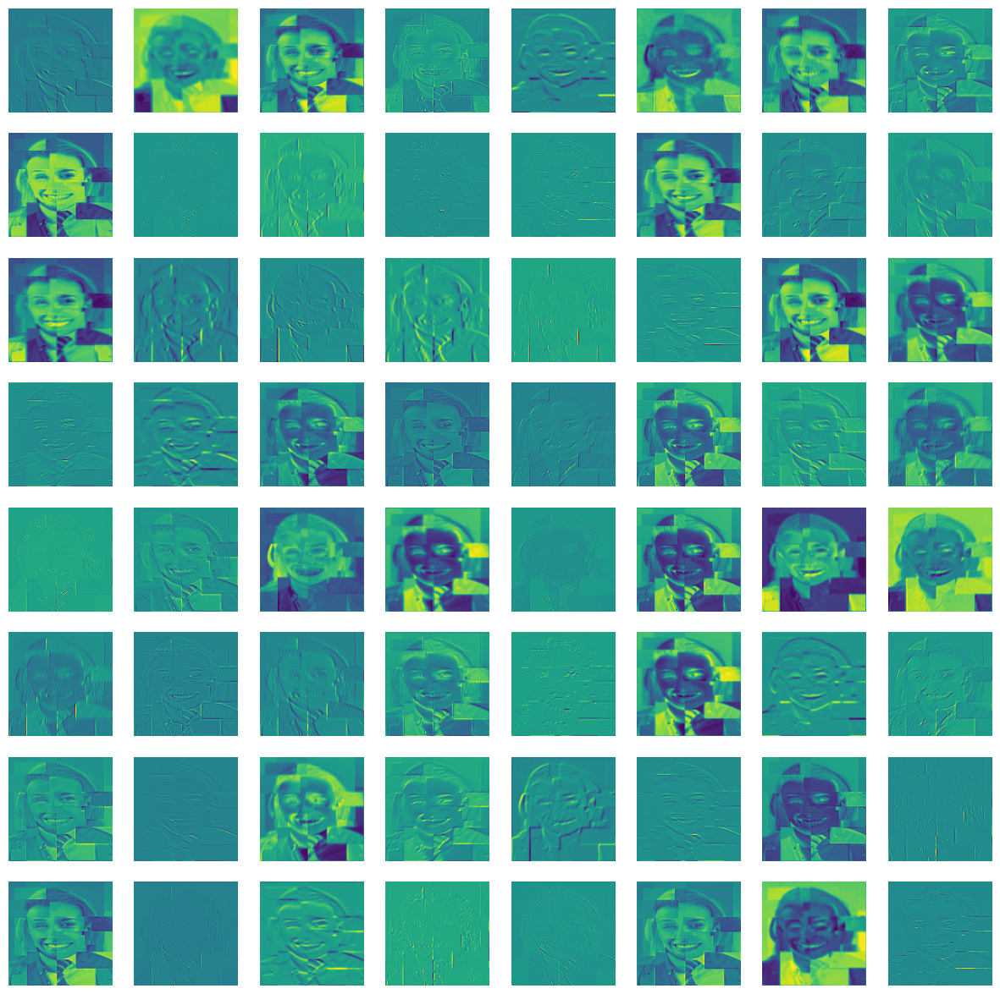

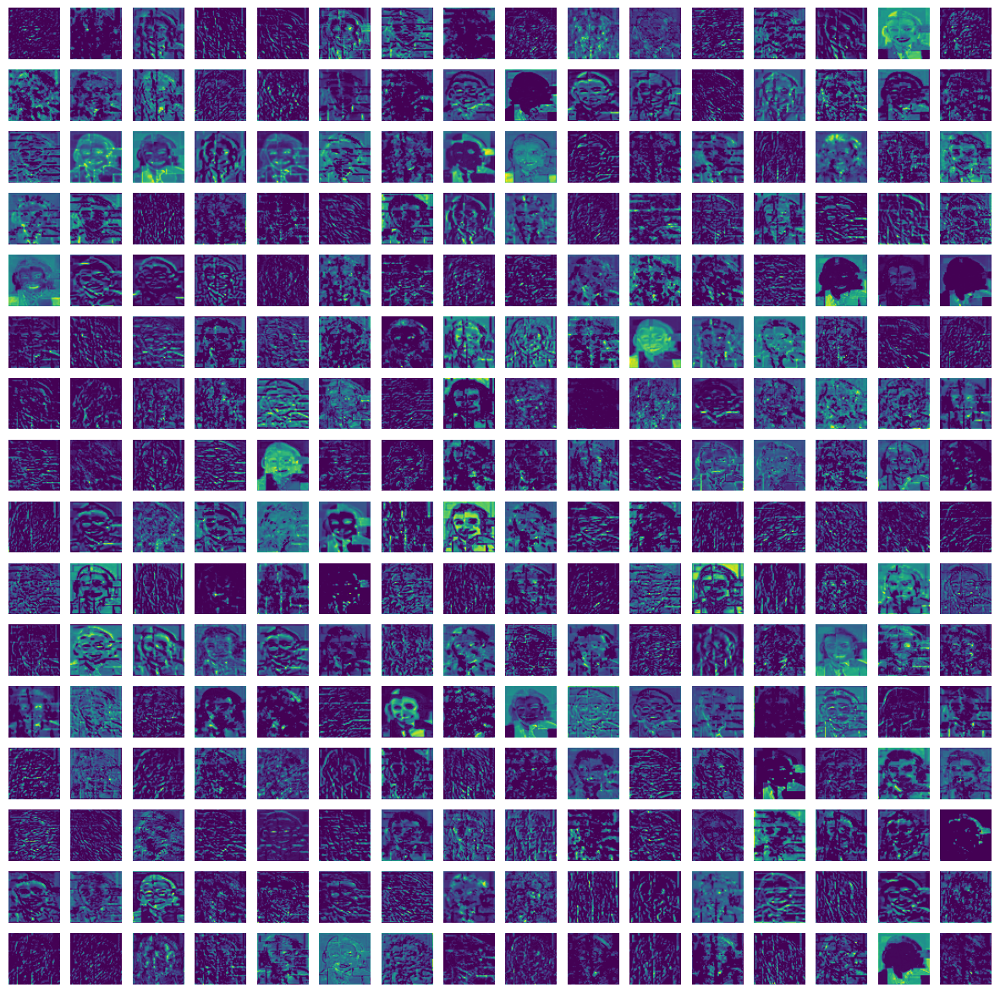

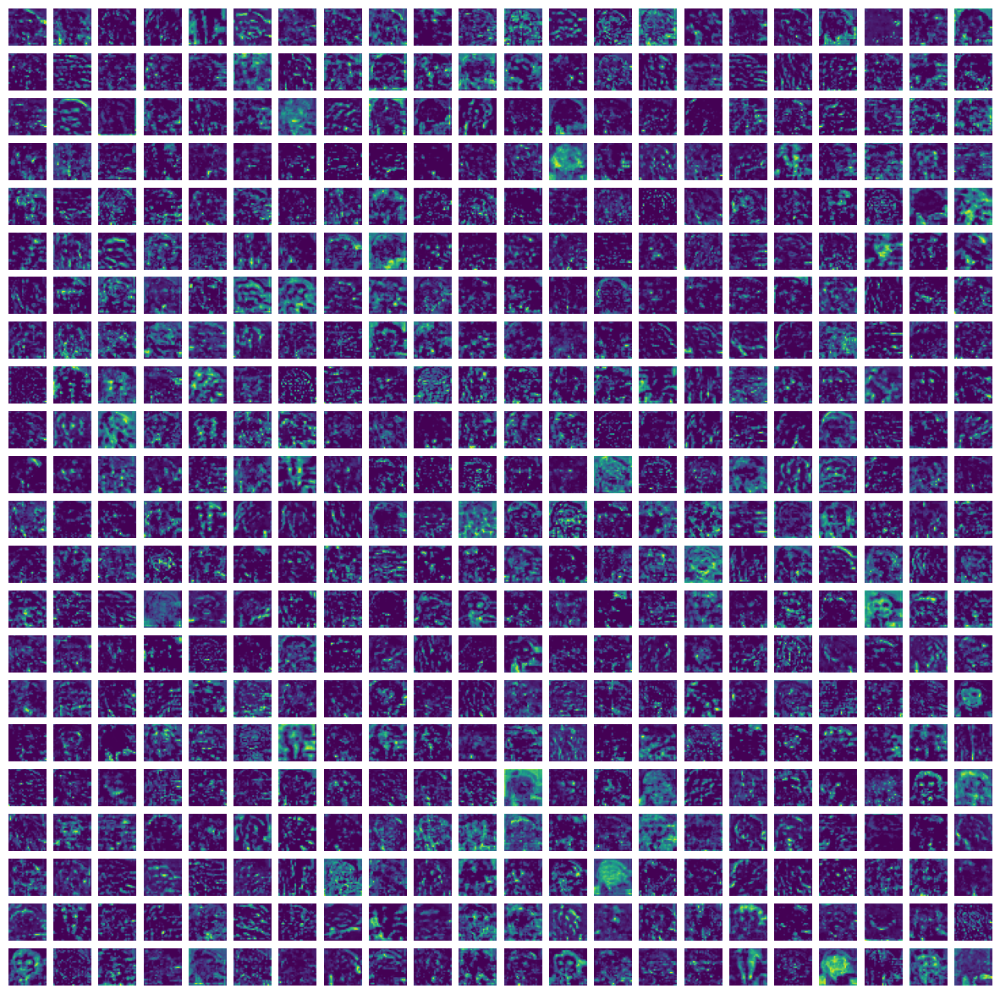

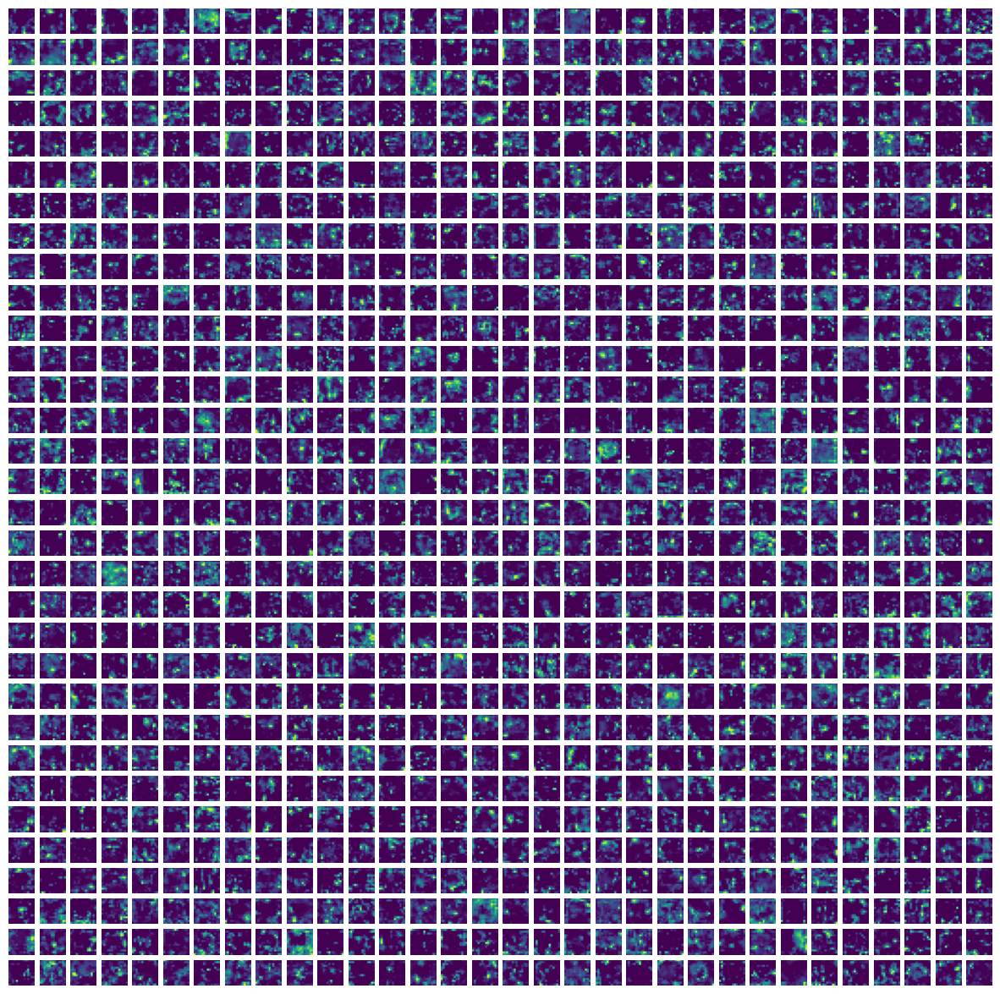

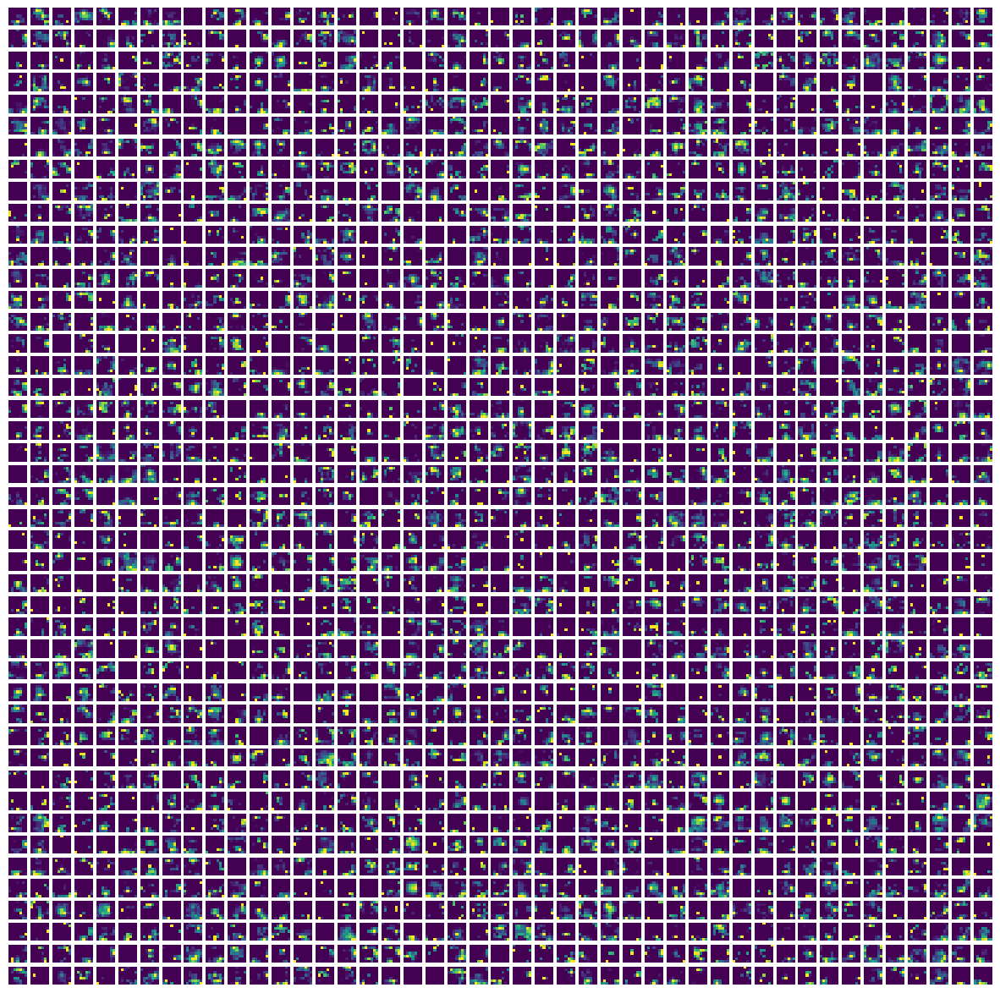

In [ ]:
from torchvision.models import resnet34, ResNet34_Weights
import matplotlib.pyplot as plt
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.models import Model
from numpy import expand_dims

def visualize_resnet_layers(img, output_folder):
    """
    Visualize feature maps from ResNet layers for a given input image.

    Args:
        model: Pre-trained ResNet model.
        img: Preprocessed input image.
        output_folder: Path to save the output images.
    """
    # Define layer names to visualize (specific ResNet layer names)
    layer_names = [
        "conv1_conv",       # Initial convolution layer
        "conv2_block3_out", # Output of 2nd residual block
        "conv3_block4_out", # Output of 3rd residual block
        "conv4_block6_out", # Output of 4th residual block
        "conv5_block3_out"  # Output of 5th residual block
    ]
    
    # Create a new model to output these intermediate layers
    model = ResNet50(weights="imagenet", include_top=False)  # Load pre-trained ResNet model
    outputs = [model.get_layer(name).output for name in layer_names]
    model = Model(inputs=model.inputs, outputs=outputs)
    
    # Expand dimensions of the image to simulate a batch
    img = expand_dims(img, axis=0)
    img = preprocess_input(img)
    
    # Get feature maps from the specified layers
    feature_maps = model.predict(img)
    
    # Plot each layer's feature maps
    for fmap in feature_maps:
        square = int(fmap.shape[-1] ** 0.5)  # Determine square size for plotting
        fig, axes = plt.subplots(square, square, figsize=(15, 15))
        axes = axes.flatten()
        
        for i in range(square * square):
            if i < fmap.shape[-1]:
                axes[i].imshow(fmap[0, :, :, i], cmap='viridis')
            axes[i].axis('off')
    
        # Save the figure
        output_path = os.path.join(output_folder, f"figure_{uuid.uuid4().hex}.png")
        plt.savefig(output_path, dpi=300)
        plt.show()

img_path = 'input_imgs/mosaic_face.jpg' # Path to your image
img = load_img(img_path, target_size=(224, 224))  # Resize to ResNet input size
img = img_to_array(img)  # Convert image to NumPy array
output_folder = "output_imgs/resnet"
visualize_resnet_layers(img, output_folder)
